In [1]:
!pip install python-igraph cairocffi

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import igraph
from tqdm.auto import tqdm

#import plotly.io
#plotly.io.renderers.default = "notebook"

In [3]:
!cp /content/drive/MyDrive/DANsem3/SR/*.csv .

In [4]:
ratings_df = pd.read_csv('ratings.csv')
meta_df = pd.read_csv('beers_metadata.csv', na_values='-')
df = pd.merge(ratings_df, meta_df, on='beer_id')
df = df.rename(columns={'rating_x': 'user_rating', 'rating_y':'beer_avg_rating'})
network_df = pd.read_csv(
    'beer_network.csv', header=None, names=['beer','similar_beer']
)

# ratings

In [5]:
ratings_df.head()

,rating,user,date,user_id,user_profile,user_avatar_link,comment,beer_id,AROMAT,WYGLĄD,SMAK,ODCZUCIE W USTACH,OGÓLNE WRAŻENIE
0,4,Piwnypolitolog.pl,02/03/2016,1147,https://www.polskikraft.pl/profil/1147,https://graph.facebook.com/v2.5/10561137277617...,"Ocena nieco uśredniona, bo różne warki się tra...",1,9/12,3/3,14/20,4/5,7/10
1,5,mojepiwa.pl,18/05/2016,1967,https://www.polskikraft.pl/profil/1967,https://platform-lookaside.fbsbx.com/platform/...,"Powrót do klasyka, którego ma się w pamięci ja...",1,NaN,NaN,NaN,NaN,NaN
2,5,Chmielokracja,20/09/2015,229,https://www.polskikraft.pl/profil/229,https://graph.facebook.com/v2.5/99666886371456...,NaN,1,NaN,NaN,NaN,NaN,NaN
3,3,Damian Popiela,27/02/2021,28165,https://www.polskikraft.pl/profil/28165,https://platform-lookaside.fbsbx.com/platform/...,NaN,1,NaN,NaN,NaN,NaN,NaN
4,4,Mateusz Mioduszewski,10/02/2021,26727,https://www.polskikraft.pl/profil/26727,https://graph.facebook.com/v2.5/32551460645640...,NaN,1,NaN,NaN,NaN,NaN,NaN


In [6]:
px.histogram(ratings_df, x="user", log_y=True, title="number of ratings per user").update_xaxes(categoryorder="total descending")

In [7]:
fig = px.histogram(
    ratings_df, x='beer_id', log_y=True, title="number of ratings per beer",
).update_xaxes(categoryorder="total descending")
fig.layout.xaxis.update({'type':'category'})
fig.show()

In [8]:
print(f"Zbiór ocen posiada {len(ratings_df)} danych")
for column in ratings_df.columns:
    #meta[column]=meta[column].replace('-',np.nan)
    if ratings_df[column].notna().all():
        print("Kolumna :",column," - Posiada wszystkie dane")
    else:
        X = sum(ratings_df[column].isna())
        print("Kolumnie :",column," - Brakuje",X,"danych")

Zbiór ocen posiada 396672 danych
Kolumna : rating  - Posiada wszystkie dane
Kolumnie : user  - Brakuje 206 danych
Kolumna : date  - Posiada wszystkie dane
Kolumna : user_id  - Posiada wszystkie dane
Kolumna : user_profile  - Posiada wszystkie dane
Kolumna : user_avatar_link  - Posiada wszystkie dane
Kolumnie : comment  - Brakuje 326745 danych
Kolumna : beer_id  - Posiada wszystkie dane
Kolumnie : AROMAT  - Brakuje 332572 danych
Kolumnie : WYGLĄD  - Brakuje 332572 danych
Kolumnie : SMAK  - Brakuje 332572 danych
Kolumnie : ODCZUCIE W USTACH  - Brakuje 332572 danych
Kolumnie : OGÓLNE WRAŻENIE  - Brakuje 332572 danych


# metadata

In [9]:
print(f"Zbiór metadanych o piwach posiada {len(ratings_df)} danych")
for column in meta_df.columns:
    #meta[column]=meta[column].replace('-',np.nan)
    if meta_df[column].notna().all():
        print("Kolumna :",column," - Posiada wszystkie dane")
    else:
        X = sum(meta_df[column].isna())
        print("Kolumnie :",column," - Brakuje",X,"danych")

Zbiór metadanych o piwach posiada 396672 danych
Kolumna : name  - Posiada wszystkie dane
Kolumna : brewery  - Posiada wszystkie dane
Kolumnie : rating  - Brakuje 552 danych
Kolumna : logo_link  - Posiada wszystkie dane
Kolumna : beer_id  - Posiada wszystkie dane
Kolumnie : blg  - Brakuje 2171 danych
Kolumna : alc  - Posiada wszystkie dane
Kolumnie : ibu  - Brakuje 7417 danych
Kolumnie : STYL  - Brakuje 1 danych
Kolumnie : CHMIELE  - Brakuje 6501 danych
Kolumnie : SŁODY  - Brakuje 7649 danych
Kolumnie : DROŻDŻE  - Brakuje 8438 danych
Kolumnie : KONTRAKTOR  - Brakuje 9567 danych
Kolumnie : INNE DODATKI  - Brakuje 6956 danych


In [10]:
meta_df.head()

,name,brewery,rating,logo_link,beer_id,blg,alc,ibu,STYL,CHMIELE,SŁODY,DROŻDŻE,KONTRAKTOR,INNE DODATKI
0,Rowing Jack,ALEBROWAR,4.2,https://www.polskikraft.pl/img/photos/14422467...,1,16.0,6.2,70.0,American India Pale Ale,"Simcoe (USA), Chinook (USA), Citra (USA), Casc...","Pale Ale, Pszeniczny, Wiedeński, Carapils®",Safale US-05,Gościszewo,NaN
1,70 Szylingów,PINTA,3.5,https://www.polskikraft.pl/img/photos/14429079...,2,NaN,3.2,NaN,Scottish Ale 70,East Kent Goldings (GB),"Pale Ale Weyermann®, Carapils®, Wędzony Wayerm...",Safbrew S-33,Pinta,NaN
2,a ja pale ale,PINTA,3.7,https://www.polskikraft.pl/img/photos/14422597...,3,12.0,4.5,NaN,American Pale Ale,"Columbus (USA), Chinook (USA), Cascade (USA), ...","Pale Ale Weyermann®, Diastatyczny jęczmieny We...",Safale US-05,Pinta,NaN
3,a'la Grodziskie,PINTA,3.2,https://www.polskikraft.pl/img/photos/14422607...,4,7.8,2.6,NaN,Grodziskie,Lubelski (PL),Pszeniczny wędzony,Safbrew S-33,Pinta,NaN
4,Ale Szycha,PINTA,4.2,https://www.polskikraft.pl/img/photos/14423453...,5,13.1,5.0,NaN,Polskie Ale,"Marynka szyszka (PL), Lubelski szyszka (PL)",Pilzneńśki Premium Weyermann,Fermentis S-04,Pinta,NaN


In [11]:
px.histogram(meta_df, x="brewery", log_y=True, title="number of beers per brewery").update_xaxes(categoryorder="total descending")

In [12]:
px.histogram(meta_df, x="KONTRAKTOR", log_y=True, title="number of beers per contractor - PLOT EXCLUDED").update_xaxes(categoryorder="total descending")

# rating and metadata jointly

In [13]:
df.head(2)

,user_rating,user,date,user_id,user_profile,user_avatar_link,comment,beer_id,AROMAT,WYGLĄD,SMAK,ODCZUCIE W USTACH,OGÓLNE WRAŻENIE,name,brewery,beer_avg_rating,logo_link,blg,alc,ibu,STYL,CHMIELE,SŁODY,DROŻDŻE,KONTRAKTOR,INNE DODATKI
0,4,Piwnypolitolog.pl,02/03/2016,1147,https://www.polskikraft.pl/profil/1147,https://graph.facebook.com/v2.5/10561137277617...,"Ocena nieco uśredniona, bo różne warki się tra...",1,9/12,3/3,14/20,4/5,7/10,Rowing Jack,ALEBROWAR,4.2,https://www.polskikraft.pl/img/photos/14422467...,16.0,6.2,70.0,American India Pale Ale,"Simcoe (USA), Chinook (USA), Citra (USA), Casc...","Pale Ale, Pszeniczny, Wiedeński, Carapils®",Safale US-05,Gościszewo,NaN
1,5,mojepiwa.pl,18/05/2016,1967,https://www.polskikraft.pl/profil/1967,https://platform-lookaside.fbsbx.com/platform/...,"Powrót do klasyka, którego ma się w pamięci ja...",1,NaN,NaN,NaN,NaN,NaN,Rowing Jack,ALEBROWAR,4.2,https://www.polskikraft.pl/img/photos/14422467...,16.0,6.2,70.0,American India Pale Ale,"Simcoe (USA), Chinook (USA), Citra (USA), Casc...","Pale Ale, Pszeniczny, Wiedeński, Carapils®",Safale US-05,Gościszewo,NaN


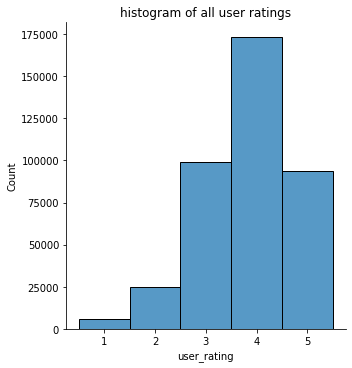

In [14]:
sns.displot(data=df, x='user_rating',
            kind='hist', binrange=(0.5, 5.5), bins=5).set(title="histogram of all user ratings");

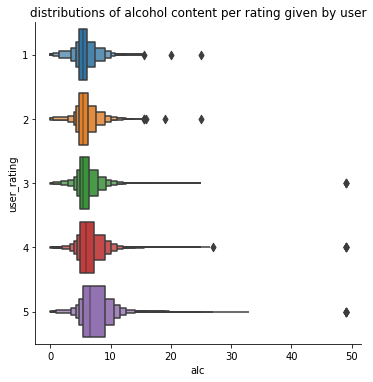

In [15]:
sns.catplot(data=df, y='user_rating', x='alc', orient='h', kind='boxen').set(title="distributions of alcohol content per rating given by user");

In [16]:
meta_df[meta_df.alc>45]

,name,brewery,rating,logo_link,beer_id,blg,alc,ibu,STYL,CHMIELE,SŁODY,DROŻDŻE,KONTRAKTOR,INNE DODATKI
4837,Ściana,BROWAR CZTERY ŚCIANY,4.2,https://www.polskikraft.pl/img/photos/15215804...,4865,12.0,49.0,NaN,American Pale Ale,"Citra (USA), Simcoe (USA)",NaN,NaN,NaN,NaN


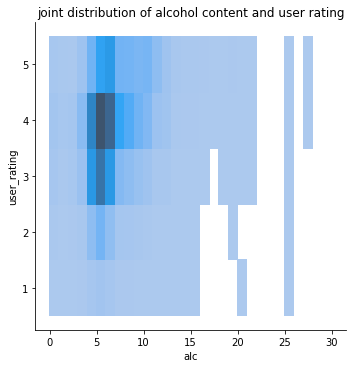

In [17]:
sns.displot(data=df, y='user_rating', x='alc', binrange=((0, 30),(0.5, 5.5)), bins=(30,5)).set(title="joint distribution of alcohol content and user rating");

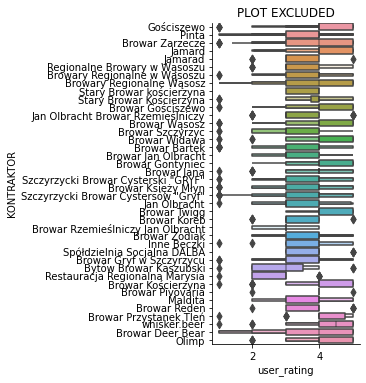

In [18]:
sns.catplot(data=df, x='user_rating', y='KONTRAKTOR', kind='boxen').set(title="PLOT EXCLUDED");

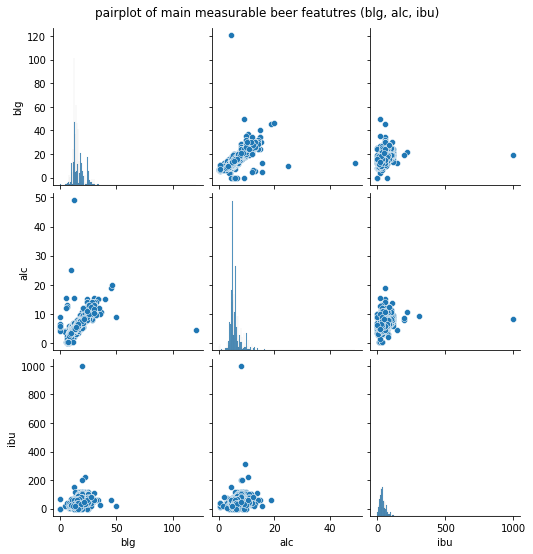

In [19]:
g = sns.pairplot(data=meta_df[['blg', 'alc', 'ibu']])
g.fig.suptitle("pairplot of main measurable beer featutres (blg, alc, ibu)", y=1.02);

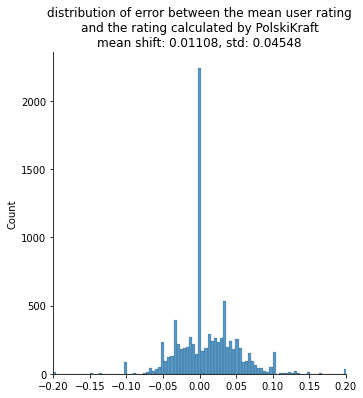

In [20]:
tmp = df.groupby('beer_id', as_index=False).mean()
errors = tmp.user_rating - tmp.beer_avg_rating
sns.displot(errors).set(xlim=(-0.2, 0.2),
    title=f'distribution of error between the mean user rating\n'
    f'and the rating calculated by PolskiKraft\n'
    f'mean shift: {errors.mean():.4}, std: {errors.std():.4}');

# beer network - recommendations by PolskiKraft.pl

In [21]:
# keep the beer ID as a string in order not to confuse 
# the vertex index and vertex name
network = igraph.Graph(directed=True)
vertices = [
    str(i) 
    for i in sorted(
        set(network_df.beer.unique()) | set(network_df.similar_beer.unique())
        )
]
network.add_vertices(
    vertices,
    attributes={
        'label': vertices,
        })
network.add_edges(network_df.astype(str).values)

In [22]:
network.clusters().summary()

'Clustering with 9678 elements and 134 clusters'

In [23]:
network_components = network.components()
network_components.summary()

'Clustering with 9678 elements and 134 clusters'

In [24]:
network_component_sizes = [len(g.vs) for g in network_components.subgraphs()]

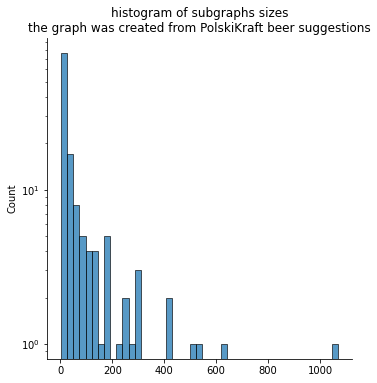

In [25]:
sns.displot(network_component_sizes).set(
    yscale='log',
    title="histogram of subgraphs sizes\n"
    "the graph was created from PolskiKraft beer suggestions");

lests chceck the beers inside some component:

In [27]:
some_idx = 2
ids = [int(x) for x in network_components.subgraphs()[some_idx].vs['name']]
ids

[5998, 6243, 6537, 9671]

In [28]:
meta_df[meta_df.beer_id.isin(ids)]

,name,brewery,rating,logo_link,beer_id,blg,alc,ibu,STYL,CHMIELE,SŁODY,DROŻDŻE,KONTRAKTOR,INNE DODATKI
5969,Lekki Fircyk,BROWAR JEDLINKA,NaN,https://www.polskikraft.pl/img/photos/15380707...,5998,12.2,4.7,NaN,Helles,NaN,NaN,NaN,NaN,NaN
6211,Zaprawa,BROWAR ZAKŁADOWY,3.2,https://www.polskikraft.pl/img/photos/15423962...,6243,12.0,5.3,NaN,Helles,Columbus (USA),NaN,Saflager W 34/70,NaN,NaN
6505,Jedno I Do Domu,BROWAR CZEŚĆ BRAT,3.8,https://www.polskikraft.pl/img/photos/15478511...,6537,NaN,5.0,NaN,Helles,NaN,NaN,NaN,NaN,NaN
9635,Helles,BROWAR FUNKY FLUID,3.6,https://www.polskikraft.pl/img/photos/15397188...,9671,10.5,4.2,NaN,Helles,"Hallertauer Mittelfrüh (DE), Spalt Select (DE)...",NaN,NaN,NaN,NaN


assuming that the clusters are based on `STYL` feature, check how it overlaps between clusters (subgraphs) 

In [29]:
styles = []
for idx in tqdm(range(len(network_components.subgraphs()))):
    ids = [int(x) for x in network_components.subgraphs()[idx].vs['name']]
    styles.append(set(meta_df[meta_df.beer_id.isin(ids)].STYL.unique()))

In [30]:
for i, a in enumerate(styles):
    for j, b in enumerate(styles):
        if i==j:
            continue
        if len(a & b) > 0:
            print(f'collision:\n{i}==={a}\n{j}==={b}\n===={a & b}')

collision:
0==={'Brett Barley Wine', 'Brett Ale', 'Brett Wild Fruit Ale', 'Brett Raburbon', 'Brett IPA'}
111==={'Northeast IPA', 'Czech IPA', 'Guava Smoothie IPA', 'Imperial Milkshake IPA', 'NZ Triple IPA', 'Little IPA', 'Pszeniczna IPA', 'Rose Brut IPA', 'Citrus IPA', 'Wild Juicy IPA', 'Polish Cascade India Pale Ale', 'Belgian Brut Biotransformated', 'Pink IPA', 'Saison IPA', 'Raspberry Rye Brown IPA', 'TDH Session IPA', 'Milkshake IPA with Lychee', 'Coffee Chocolate Milkshake IPA', 'Simcoe Amarillo IPA', 'IPA Single Hop Chinook', 'Pear Session IPA', 'Red Rye Juniper IPA', 'Wild IPA', 'DDH DIPA', 'Trois Session IPA', 'Sour Hazy Session IPA', 'New Zealand IPA', 'Passion Fruit Milkshake IPA', 'Lactose Bluberry IPA', '4K Ultra HD* IPA', 'Australian IPA', 'Mint IPA', 'Podwójne IPA', 'Cascadian Dark Ale', 'Columbus IPA', 'New Zealand Brown IPA', 'Belgian IPA', 'British IPA', 'Tonka Milkshake IPA', 'NZ DDH IPA', 'Herbaciane IPA', 'Bubble Gum IPA', 'Brut Midwest IPA', 'Blueberry IPA', 'Brown

Indeed, it seems like the clusters are based mainly on `STYL` feature.